# Spatial interpolation

> **The contents will appear later**
>
> This section will contain hands-on material that will appear later.

In [1]:
import geopandas as gpd
import tobler
import pyinterpolate
import numpy as np

from libpysal import graph
from sklearn import neighbors
from scipy import interpolate

## Area interpolation

In [2]:
simd = gpd.read_file("data/edinburgh_simd_2020.gpkg")
simd.head(2)

2 rows × 52 columns

In [3]:
simd[["EmpRate", "geometry"]].explore("EmpRate", tiles="CartoDB Positron")

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_5cd64d5d1783899c4301484d0fd8f92e {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_5cd64d5d1783899c4301484d0fd8f92e" ></div>
 
</body>
<script>
 
 
 var map_5cd64d5d1783899c4301484d0fd8f92e = L.map(
 "map_5cd64d5d1783899c4301484d0fd8f92e",
 {
 center: [55.91548084724146, -3.2636050528061906],
 crs: L.CRS.EPSG3857,
 zoom: 10,
 zoomControl: true,
 preferCanvas: false,
 }
 );
 L.control.scale().addTo(map_5cd64d5d1783899c4301484d0fd8f92e);

 

 
 
 var tile_layer_3335263d10c2f3609324ca0b842dbe0a = L.tileLayer(
 "https://a.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e", "detectRetina": false, "maxNativeZoom": 20, "maxZoom": 20, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 ).addTo(map_5cd64d5d1783899c4301484d0fd8f92e);
 
 
 map_5cd64d5d1783899c4301484d0fd8f92e.fitBounds(
 [[55.818791345760204, -3.4495294825265796], [56.01217034872272, -3.077680623085801]],
 {}
 );
 
 
 function geo_json_8d3b3e1813fae4cc43ac94b6bf29bad7_styler(feature) {
 switch(feature.id) {
 case "0": case "3": case "7": case "15": case "17": case "19": case "21": case "23": case "26": case "31": case "68": case "87": case "90": case "130": case "131": case "133": case "135": case "157": case "163": case "174": case "177": case "185": case "187": case "189": case "192": case "195": case "197": case "207": case "212": case "216": case "226": case "231": case "243": case "251": case "254": case "273": case "279": case "281": case "304": case "310": case "312": case "318": case "324": case "345": case "346": case "388": case "401": case "402": case "404": case "406": case "407": case "414": case "416": case "427": case "455": case "457": case "475": case "495": case "496": case "520": case "525": case "529": case "530": case "545": case "549": case "550":

In [4]:
grid_8 = tobler.util.h3fy(simd, resolution=8)
grid_8.head(2)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/pyproj/crs/crs.py:1293: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)

In [5]:
m = simd.boundary.explore(tiles="CartoDB Positron")
grid_8.boundary.explore(m=m, color="red")

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_3f6c04b234164d67b5e60a611f3cc936 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
</head>
<body>
 
 
 <div class="folium-map" id="map_3f6c04b234164d67b5e60a611f3cc936" ></div>
 
</body>
<script>
 
 
 var map_3f6c04b234164d67b5e60a611f3cc936 = L.map(
 "map_3f6c04b234164d67b5e60a611f3cc936",
 {
 center: [55.91548084724146, -3.2636050528061906],
 crs: L.CRS.EPSG3857,
 zoom: 10,
 zoomControl: true,
 preferCanvas: false,
 }
 );
 L.control.scale().addTo(map_3f6c04b234164d67b5e60a611f3cc936);

 

 
 
 var tile_layer_703aecd48ecd54058cde87ba5d481172 = L.tileLayer(
 "https://a.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e", "detectRetina": false, "maxNativeZoom": 20, "maxZoom": 20, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 ).addTo(map_3f6c04b234164d67b5e60a611f3cc936);
 
 
 map_3f6c04b234164d67b5e60a611f3cc936.fitBounds(
 [[55.818791345760204, -3.4495294825265796], [56.01217034872272, -3.077680623085801]],
 {}
 );
 
 
 function geo_json_b56985ea00611313cf872cb4983ac7a3_styler(feature) {
 switch(feature.id) {
 default:
 return {"fillOpacity": 0.5, "weight": 2};
 }
 }
 function geo_json_b56985ea00611313cf872cb4983ac7a3_highlighter(feature) {
 switch(feature.id) {
 default:
 return {"fillOpacity": 0.75};
 }
 }
 function geo_json_b56985ea00611313cf872cb4983ac7a3_pointToLayer(feature, latlng) {
 var opts = {"bubblingMouseEvents": true, "color": "#3388ff", "dashArray": null, "dashOffset": null, "fill": true, "fillColor": "#3388ff", "fillOpacity": 0.2, "fillRule": "evenodd", "lineCap": "round", "lineJoin": "round", "opacity": 1.0, "radius": 2, "stroke": true, "weight": 3};
 
 let style = geo_json_b56985ea00611313cf872cb4983ac7a3_styler(feature)
 Object.assign(opts, style)
 
 return new L.CircleMarker(latlng, opts)
 }

 function geo_json_b56985ea00611313cf872cb4983ac7a3_onEachFeature(feature, layer) {
 layer.on({
 mouseout: function(e) {
 if(typeof e.target.s

In [6]:
interpolated = tobler.area_weighted.area_interpolate(
    simd,
    grid_8,
    extensive_variables=["EmpNumDep", "IncNumDep"],
    intensive_variables=["EmpRate", "IncRate"],
)

In [7]:
interpolated.explore("EmpRate", tiles="CartoDB Positron")

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_8ff9cf17ba9f30d5e1fe9d6bac456726 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_8ff9cf17ba9f30d5e1fe9d6bac456726" ></div>
 
</body>
<script>
 
 
 var map_8ff9cf17ba9f30d5e1fe9d6bac456726 = L.map(
 "map_8ff9cf17ba9f30d5e1fe9d6bac456726",
 {
 center: [55.911620089332004, -3.2651690979931915],
 crs: L.CRS.EPSG3857,
 zoom: 10,
 zoomControl: true,
 preferCanvas: false,
 }
 );
 L.control.scale().addTo(map_8ff9cf17ba9f30d5e1fe9d6bac456726);

 

 
 
 var tile_layer_17fcd546fe02b6aa52e4837890975b5f = L.tileLayer(
 "https://a.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e", "detectRetina": false, "maxNativeZoom": 20, "maxZoom": 20, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 ).addTo(map_8ff9cf17ba9f30d5e1fe9d6bac456726);
 
 
 map_8ff9cf17ba9f30d5e1fe9d6bac456726.fitBounds(
 [[55.82084390326666, -3.452142523292945], [56.00239627539734, -3.078195672693438]],
 {}
 );
 
 
 function geo_json_3806ae06960484168e51ff80ceb05a81_styler(feature) {
 switch(feature.id) {
 case "0": case "322": case "344": 
 return {"color": "#463480", "fillColor": "#463480", "fillOpacity": 0.5, "weight": 2};
 case "1": case "149": case "163": case "283": 
 return {"color": "#443983", "fillColor": "#443983", "fillOpacity": 0.5, "weight": 2};
 case "2": case "72": case "82": case "128": 
 return {"color": "#460a5d", "fillColor": "#460a5d", "fillOpacity": 0.5, "weight": 2};
 case "3": case "4": case "5": case "13": case "18": case "46": case "57": case "60": case "74": case "92": case "101": case "107": case "123": case "131": case "147": case "157": case "170": case "175": case "194": case "214": case "216": case "219": case "222": case "230": case "233": case "237": case "253": case "254": case "262": case "278": case "279": case "280": case "284": ca

## Point interpolation

In [8]:
airbnb = gpd.read_file("data/edinburgh_airbnb_2023.gpkg")
airbnb.head()

In [9]:
airbnb.price.head()

0    $126.00
1    $269.00
2     $95.00
3    $172.00
4    $361.00
Name: price, dtype: object

In [10]:
airbnb["price_float"] = airbnb.price.str.strip("$").str.replace(",", "").astype(float)

In [11]:
two_bed_homes = airbnb[
    (airbnb["bedrooms"] == 2)
    & (airbnb["property_type"] == "Entire rental unit")
    & (airbnb["price_float"] < 300)
].copy()
two_bed_homes.head()

In [12]:
two_bed_homes.geometry.duplicated().any()

True

In [13]:
two_bed_homes = two_bed_homes.drop_duplicates("geometry")

In [14]:
two_bed_homes.explore("price_float", tiles="CartoDB Positron")

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_0a902af6ce45988de094b793e751c9dc {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_0a902af6ce45988de094b793e751c9dc" ></div>
 
</body>
<script>
 
 
 var map_0a902af6ce45988de094b793e751c9dc = L.map(
 "map_0a902af6ce45988de094b793e751c9dc",
 {
 center: [55.937265, -3.2510422245910693],
 crs: L.CRS.EPSG3857,
 zoom: 10,
 zoomControl: true,
 preferCanvas: false,
 }
 );
 L.control.scale().addTo(map_0a902af6ce45988de094b793e751c9dc);

 

 
 
 var tile_layer_ebfb8b212bfb8ae875c3e5ad1a9eeb0d = L.tileLayer(
 "https://a.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e", "detectRetina": false, "maxNativeZoom": 20, "maxZoom": 20, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 ).addTo(map_0a902af6ce45988de094b793e751c9dc);
 
 
 map_0a902af6ce45988de094b793e751c9dc.fitBounds(
 [[55.88358, -3.407260000000005], [55.99095, -3.094824449182134]],
 {}
 );
 
 
 function geo_json_b952e2d60c998fb53196af366ae338b9_styler(feature) {
 switch(feature.id) {
 case "3": case "1366": case "1396": case "2268": case "3932": case "3979": case "6882": case "7054": 
 return {"color": "#1f958b", "fillColor": "#1f958b", "fillOpacity": 0.5, "weight": 2};
 case "5": case "53": case "549": case "5632": 
 return {"color": "#aadc32", "fillColor": "#aadc32", "fillOpacity": 0.5, "weight": 2};
 case "6": case "1375": case "7551": case "7562": 
 return {"color": "#1f9a8a", "fillColor": "#1f9a8a", "fillOpacity": 0.5, "weight": 2};
 case "10": case "562": case "630": case "972": case "1931": case "3381": case "3637": case "6192": case "7009": case "7152": 
 return {"color": "#23888e", "fillColor": "#23888e", "fillOpacity": 0.5, "weight": 2};
 case "17": case "255": case "1490": case "2596": case "3166": case "5204": case "7048": case "7594": 
 return {"color": "#2486

In [15]:
from libpysal import graph

knn = graph.Graph.build_kernel(two_bed_homes, k=10).transform("r")
two_bed_homes["price_lag"] = knn.lag(two_bed_homes.price_float)
two_bed_homes.explore("price_lag", tiles="CartoDB Positron")

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):

Make this Notebook Trusted to load map: File -> Trust Notebook <iframe srcdoc="<!DOCTYPE html>
<html>
<head>
 
 <meta http-equiv="content-type" content="text/html; charset=UTF-8" />
 
 <script>
 L_NO_TOUCH = false;
 L_DISABLE_3D = false;
 </script>
 
 <style>html, body {width: 100%;height: 100%;margin: 0;padding: 0;}</style>
 <style>#map {position:absolute;top:0;bottom:0;right:0;left:0;}</style>
 <script src="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.js"></script>
 <script src="https://code.jquery.com/jquery-1.12.4.min.js"></script>
 <script src="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/js/bootstrap.bundle.min.js"></script>
 <script src="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.js"></script>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/leaflet@1.9.3/dist/leaflet.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/bootstrap@5.2.2/dist/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://netdna.bootstrapcdn.com/bootstrap/3.0.0/css/bootstrap.min.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/npm/@fortawesome/fontawesome-free@6.2.0/css/all.min.css"/>
 <link rel="stylesheet" href="https://cdnjs.cloudflare.com/ajax/libs/Leaflet.awesome-markers/2.0.2/leaflet.awesome-markers.css"/>
 <link rel="stylesheet" href="https://cdn.jsdelivr.net/gh/python-visualization/folium/folium/templates/leaflet.awesome.rotate.min.css"/>
 
 <meta name="viewport" content="width=device-width,
 initial-scale=1.0, maximum-scale=1.0, user-scalable=no" />
 <style>
 #map_4297fe6de75b56939445f7db30651945 {
 position: relative;
 width: 100.0%;
 height: 100.0%;
 left: 0.0%;
 top: 0.0%;
 }
 .leaflet-container { font-size: 1rem; }
 </style>
 
 
 <style>
 .foliumtooltip {
 
 }
 .foliumtooltip table{
 margin: auto;
 }
 .foliumtooltip tr{
 text-align: left;
 }
 .foliumtooltip th{
 padding: 2px; padding-right: 8px;
 }
 </style>
 
 <script src="https://cdnjs.cloudflare.com/ajax/libs/d3/3.5.5/d3.min.js"></script>
</head>
<body>
 
 
 <div class="folium-map" id="map_4297fe6de75b56939445f7db30651945" ></div>
 
</body>
<script>
 
 
 var map_4297fe6de75b56939445f7db30651945 = L.map(
 "map_4297fe6de75b56939445f7db30651945",
 {
 center: [55.937265, -3.2510422245910693],
 crs: L.CRS.EPSG3857,
 zoom: 10,
 zoomControl: true,
 preferCanvas: false,
 }
 );
 L.control.scale().addTo(map_4297fe6de75b56939445f7db30651945);

 

 
 
 var tile_layer_2bd19633ab5ab4117c2cddbec475eb73 = L.tileLayer(
 "https://a.basemaps.cartocdn.com/light_all/{z}/{x}/{y}{r}.png",
 {"attribution": "\u0026copy; \u003ca href=\"https://www.openstreetmap.org/copyright\"\u003eOpenStreetMap\u003c/a\u003e contributors \u0026copy; \u003ca href=\"https://carto.com/attributions\"\u003eCARTO\u003c/a\u003e", "detectRetina": false, "maxNativeZoom": 20, "maxZoom": 20, "minZoom": 0, "noWrap": false, "opacity": 1, "subdomains": "abc", "tms": false}
 ).addTo(map_4297fe6de75b56939445f7db30651945);
 
 
 map_4297fe6de75b56939445f7db30651945.fitBounds(
 [[55.88358, -3.407260000000005], [55.99095, -3.094824449182134]],
 {}
 );
 
 
 function geo_json_47419219a21a408a0f2e1fd013d61e9c_styler(feature) {
 switch(feature.id) {
 case "3": case "10": case "121": case "1455": case "2113": case "3026": case "7109": 
 return {"color": "#70cf57", "fillColor": "#70cf57", "fillOpacity": 0.5, "weight": 2};
 case "5": case "825": case "2267": case "3580": 
 return {"color": "#1e9c89", "fillColor": "#1e9c89", "fillOpacity": 0.5, "weight": 2};
 case "6": case "1071": case "1360": case "1449": case "2212": case "2568": case "3958": 
 return {"color": "#21908d", "fillColor": "#21908d", "fillOpacity": 0.5, "weight": 2};
 case "17": case "549": case "1325": 
 return {"color": "#aadc32", "fillColor": "#aadc32", "fillOpacity": 0.5, "weight": 2};
 case "19": case "258": case "746": case "1920": case "2194": case "2403": case "2424": case "2887": case "3242": case "4174": case "6945": case "7146": case "7512": 
 return {"color": "#32b6

### Nearest

In [16]:
grid_10 = tobler.util.h3fy(simd, resolution=10)
len(grid_10)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/pyproj/crs/crs.py:1293: UserWarning: You will likely lose important projection information when converting to a PROJ string from another format. See: https://proj.org/faq.html#what-is-the-best-format-for-describing-coordinate-reference-systems
  proj = self._crs.to_proj4(version=version)

20162

In [17]:
grid_coordinates = grid_10.centroid.get_coordinates()
grid_coordinates.head()

In [18]:
coords = two_bed_homes.get_coordinates()
coords.head()

In [19]:
nearest = interpolate.griddata(
    coords,
    two_bed_homes.price_lag,
    grid_coordinates,
    method="nearest",
)
nearest

array([170.2173363 , 181.        , 181.        , ..., 188.70398583,
       188.70398583,  84.        ])

In [20]:
grid_10["nearest"] = nearest

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

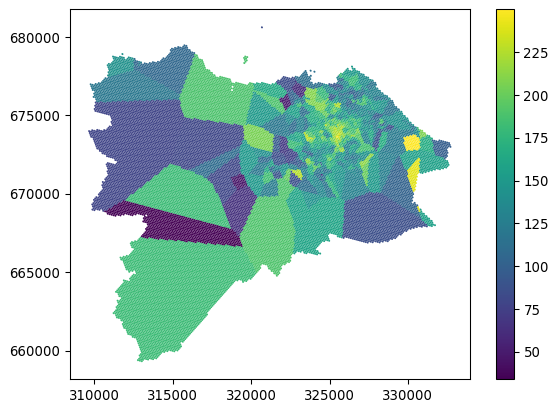

In [21]:
_ = grid_10.plot('nearest', legend=True)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

<Axes: >

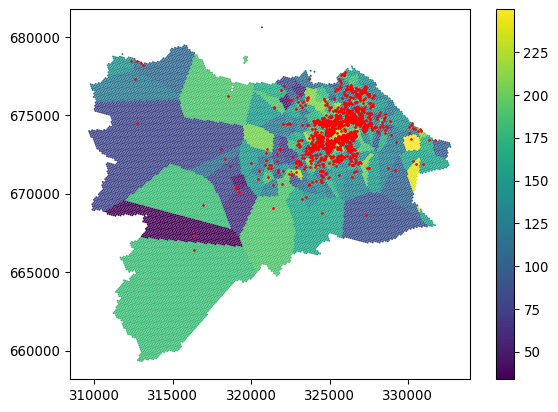

In [22]:
ax = grid_10.plot('nearest', legend=True)
two_bed_homes.plot(ax=ax, color="red", markersize=1)

### K-Nearest neighbours regression

#### Uniform

In [23]:
interpolation_uniform = neighbors.KNeighborsRegressor(n_neighbors=10, weights="uniform")

In [24]:
interpolation_uniform.fit(
    coords, two_bed_homes.price_lag
)

KNeighborsRegressor(n_neighbors=10) In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. KNeighborsRegressor KNeighborsRegressor(n_neighbors=10)

In [25]:
price_on_grid = interpolation_uniform.predict(grid_coordinates)
price_on_grid

array([165.05138173, 112.9987658 , 104.67717907, ..., 120.36697169,
       120.36697169, 120.36697169])

In [26]:
grid_10["knn_uniform"] = price_on_grid

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

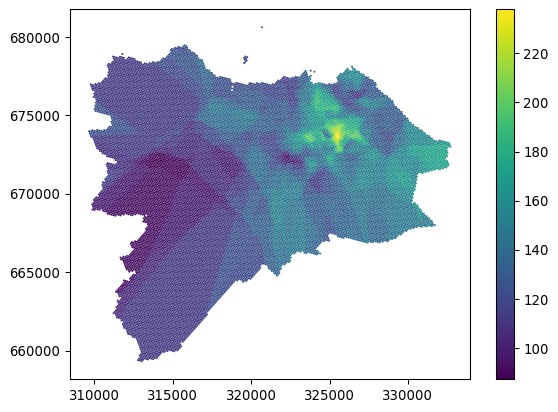

In [27]:
_ = grid_10.plot("knn_uniform", legend=True)

#### Distance-weighted

In [28]:
interpolation_distance = neighbors.KNeighborsRegressor(n_neighbors=10, weights="distance")

In [29]:
interpolation_distance.fit(
    coords, two_bed_homes.price_lag
)

KNeighborsRegressor(n_neighbors=10, weights='distance') In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. KNeighborsRegressor KNeighborsRegressor(n_neighbors=10, weights='distance')

In [30]:
grid_10["knn_distance"] = interpolation_distance.predict(grid_coordinates)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

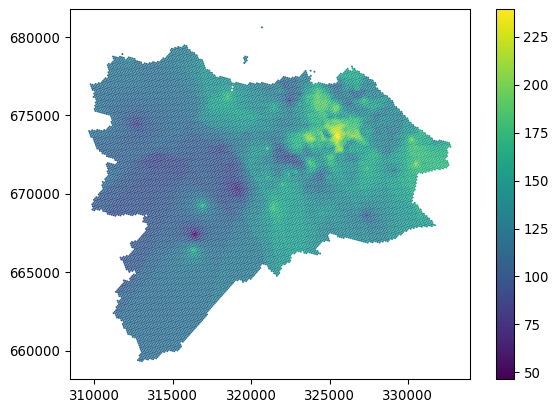

In [31]:
_ = grid_10.plot("knn_distance", legend=True)

### Distance band regression

In [32]:
interpolation_radius = neighbors.RadiusNeighborsRegressor(radius=1000, weights="distance")
interpolation_radius.fit(
    coords, two_bed_homes.price_lag
)

RadiusNeighborsRegressor(radius=1000, weights='distance') In a Jupyter environment, please rerun this cell to show the HTML representation or trust the notebook. On GitHub, the HTML representation is unable to render, please try loading this page with nbviewer.org. RadiusNeighborsRegressor RadiusNeighborsRegressor(radius=1000, weights='distance')

In [33]:
grid_10["radius"] = interpolation_radius.predict(grid_coordinates)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/sklearn/neighbors/_regression.py:500: UserWarning: One or more samples have no neighbors within specified radius; predicting NaN.
  warnings.warn(empty_warning_msg)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

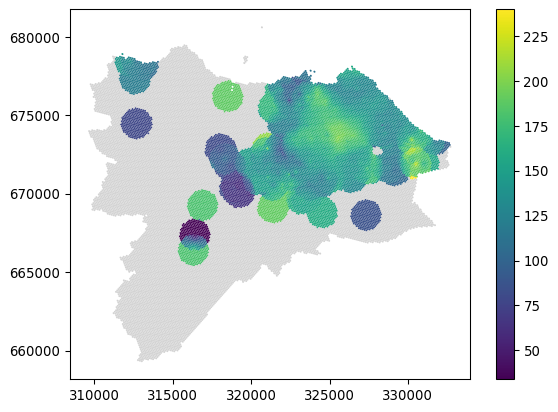

In [34]:
_ = grid_10.plot("radius", legend=True, missing_kwds={'color': 'lightgrey'})

### Ordinary Kriging

In [35]:
input_data = np.hstack([coords, two_bed_homes.price_lag.values.reshape(-1, 1)])
input_data

array([[3.26748646e+05, 6.74001683e+05, 2.07033397e+02],
       [3.24950724e+05, 6.73875598e+05, 1.54805935e+02],
       [3.26493725e+05, 6.72853904e+05, 1.43865293e+02],
       ...,
       [3.28513265e+05, 6.74048892e+05, 1.06875409e+02],
       [3.26840903e+05, 6.74767224e+05, 1.68848108e+02],
       [3.25415664e+05, 6.73345158e+05, 2.15847334e+02]])

In [36]:
step_radius = 100  # meters
max_range = 5000  # meters

exp_semivar = pyinterpolate.build_experimental_variogram(
    input_array=input_data,
    step_size=step_radius,
    max_range=max_range,
)

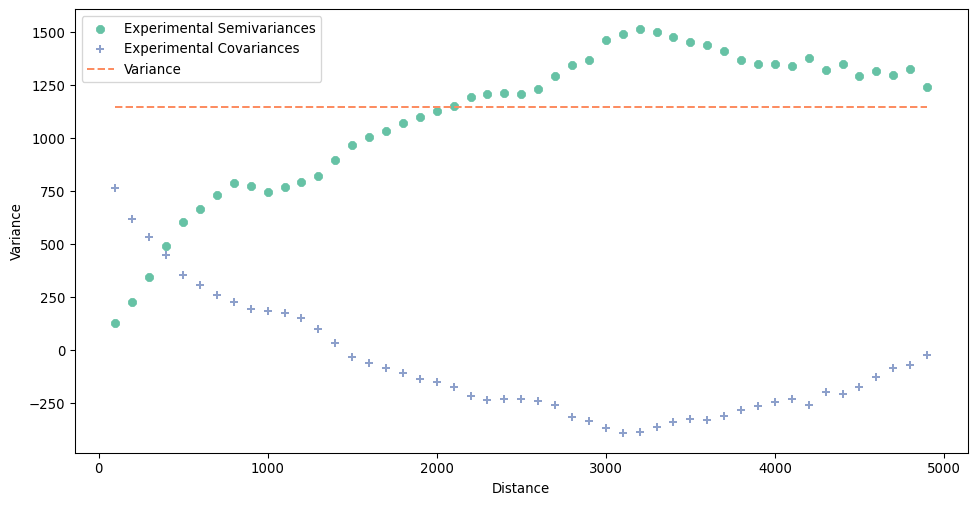

In [37]:
exp_semivar.plot()

In [38]:
semivar = pyinterpolate.build_theoretical_variogram(
    experimental_variogram=exp_semivar,
    model_name='linear',
    sill=exp_semivar.variance,
    rang=5000
)

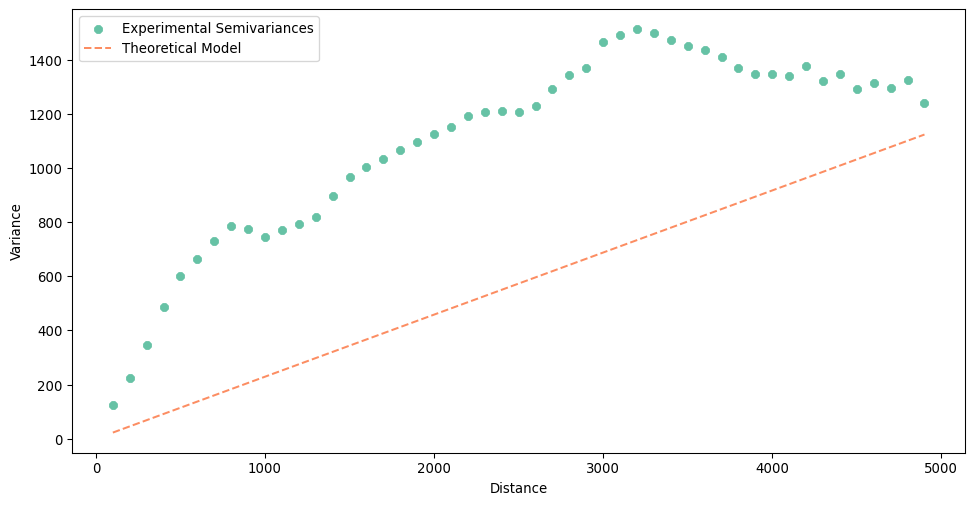

In [39]:
semivar.plot()

In [40]:
ordinary_kriging = pyinterpolate.kriging(
    observations=input_data,
    theoretical_model=semivar,
    points=grid_coordinates.values,
    no_neighbors=10,
    how="ok",
    show_progress_bar=False,
)

In [41]:
grid_10["ordinary_kriging"] = ordinary_kriging[:, 0]

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

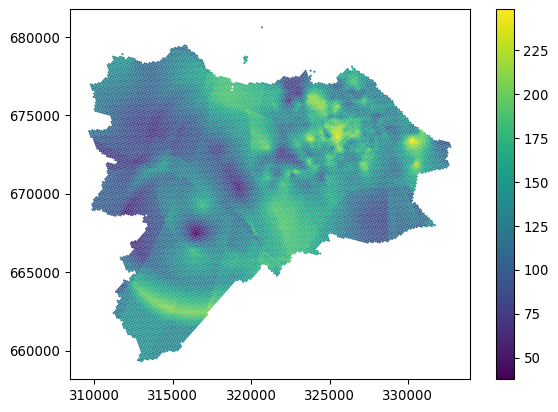

In [42]:
_ = grid_10.plot("ordinary_kriging", legend=True)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

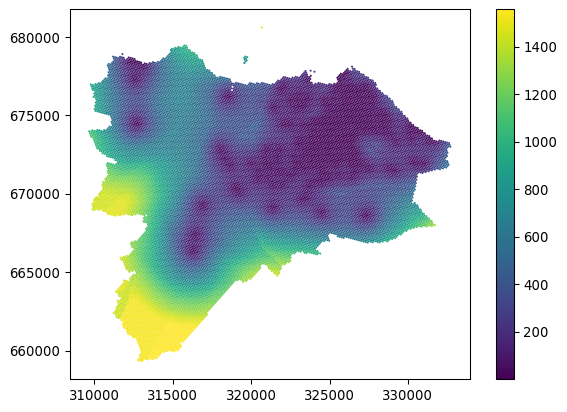

In [43]:
grid_10["variance_error"] = ordinary_kriging[:, 1]
_ = grid_10.plot("variance_error", legend=True)

Use larger distance

In [44]:
semivar_larger = pyinterpolate.build_theoretical_variogram(
    experimental_variogram=exp_semivar,
    model_name='linear',
    sill=exp_semivar.variance,
    rang=15000,
)

In [45]:
ordinary_kriging_l = pyinterpolate.kriging(
    observations=input_data,
    theoretical_model=semivar_larger,
    points=grid_coordinates.values,
    no_neighbors=10,
    how="ok",
    show_progress_bar=False,
)

In [46]:
grid_10["ok_larger"] = ordinary_kriging_l[:, 0]

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

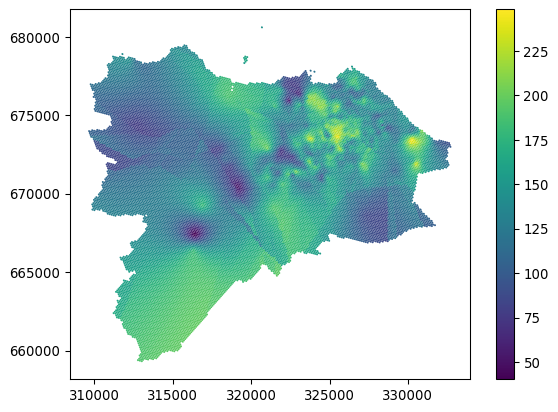

In [47]:
_ = grid_10.plot("ok_larger", legend=True)

/home/runner/micromamba/envs/sds/lib/python3.11/site-packages/geopandas/plotting.py:732: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(values.dtype):

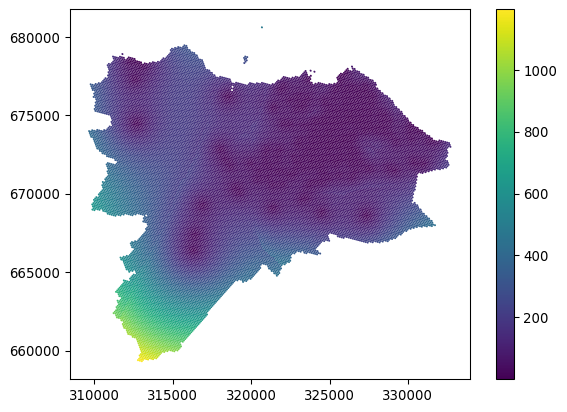

In [48]:
grid_10["variance_error_l"] = ordinary_kriging_l[:, 1]
_ = grid_10.plot("variance_error_l", legend=True)